# Project Akhir Praktikum Statistika Dasar #
# Deesya Lovely Susanto (3321600013) #

Dataset Column Description:

age: age in years
sex: sex (1 = male; 0 = female)
cp: chest pain type — Value 1: typical angina (TA) — Value 2: atypical angina (ATA)— Value 3: non-anginal pain (NAP) — Value 4: asymptomatic(ASY)
RestingBP: resting blood pressure (in mm Hg on admission to the hospital)
Cholesterol: serum cholestoral in mg/dl
FastingBS: (fasting blood sugar > 120 mg/dl) (1 = true; 0 = false)
RestingECG: resting electrocardiographic results — Value 0: normal — Value 1: having ST-T wave abnormality Value 2: showing probable or definite left ventricular hypertrophy by Estes’ criteria 20 ekgmo (LVH)
MaxHR: Maximum Heart Rate
ExerciseAngina: exercise induced angina (1 = yes; 0 = no)
OldPeak= ST depression induced by exercise relative to rest
ST_Slope: the slope of the peak exercise ST segment — Value 1: upsloping(up) — Value 2: flat — Value 3: downsloping(down)
HeartDisease: 0(no presence) 1(presence)

Goal: Memprediksi apakah seorang pasien terkena kerusakan jantung atau tidak.
Positif (+) = 1, pasien yang didiagnosis dengan Penyakit Jantung
Negatif (-) = 0, pasien tidak didiagnosis dengan Penyakit Jantung

# Memuat Library #

In [2]:
#importing libraries
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.impute import KNNImputer

from sklearn.decomposition import PCA

import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import Dataset,DataLoader
import torch.optim as optim


import optuna
from optuna.trial import TrialState


import warnings
warnings.filterwarnings('ignore')

In [42]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install torch

Note: you may need to restart the kernel to use updated packages.Collecting torch



In [36]:
pip install optuna

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: tqdm in c:\users\deesy\anaconda3\lib\site-packages (from optuna) (4.59.0)



  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11107 sha256=262abbf0fb68bc3517125b6584aa5061eb60c913b1d0ac6a08cfc695c356e576
  Stored in directory: c:\users\deesy\appdata\local\pip\cache\wheels\7f\1a\65\84ff8c386bec21fca6d220ea1f5498a0367883a78dd5ba6122
Successfully built pyperclip


# Memuat & Membaca Dataset #

In [3]:
df = pd.read_csv('heart project akhir.csv')
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [8]:
df.tail()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
913,45,M,TA,110,264,0,Normal,132,N,1.2,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.4,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.2,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.0,Flat,1
917,38,M,NAP,138,175,0,Normal,173,N,0.0,Up,0


In [82]:
df.HeartDisease.value_counts()

1    508
0    410
Name: HeartDisease, dtype: int64

# Eksplorasi Data #

In [9]:
fig = px.histogram(df, x="HeartDisease", color="HeartDisease")
fig.update_layout(height=400, width=500, showlegend=True)
fig.update_traces(marker_line_width=1,marker_line_color="black")
fig.show()

Terdapat 508 orang yang diprediksi mengalami kerusakan jantung dan sisanya, 410 orang tanpa kerusakan jantung. (our problem is balanced).

In [11]:
#Pasien dalam bentuk persen
countNoDisease = len(df[df.HeartDisease == 0])
countHaveDisease = len(df[df.HeartDisease == 1])
print("Presentasi pasien yang tidak mengalami kerusakan jantung: {:.2f}%".format((countNoDisease / (len(df.HeartDisease))*100)))
print("Presentasi pasien yang mengalami kerusakan jantung: {:.2f}%".format((countHaveDisease / (len(df.HeartDisease))*100)))

Presentasi pasien yang tidak mengalami kerusakan jantung: 44.66%
Presentasi pasien yang mengalami kerusakan jantung: 55.34%


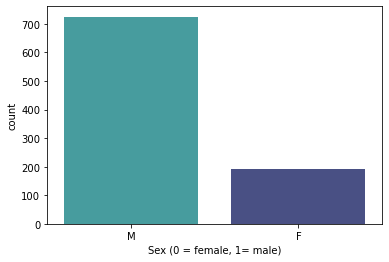

In [48]:
sns.countplot(x='Sex', data=df, palette="mako_r")
plt.xlabel("Sex (0 = female, 1= male)")
plt.show()

In [32]:
countFemale = len(df[df.Sex == 0])
countMale = len(df[df.Sex == 1])
print("Persentasi pasien wanita: {:.2f}%".format((countFemale / (len(df.Sex))*100)))
print("Persentasi pasien pria: {:.2f}%".format((countMale / (len(df.Sex))*100)))

Persentasi pasien wanita: 0.00%
Persentasi pasien pria: 0.00%


In [34]:
df.groupby('HeartDisease').mean()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak
HeartDisease,,,,,,
0,50.551220,130.180488,227.121951,0.107317,148.151220,0.408049
1,55.899606,134.185039,175.940945,0.334646,127.655512,1.274213


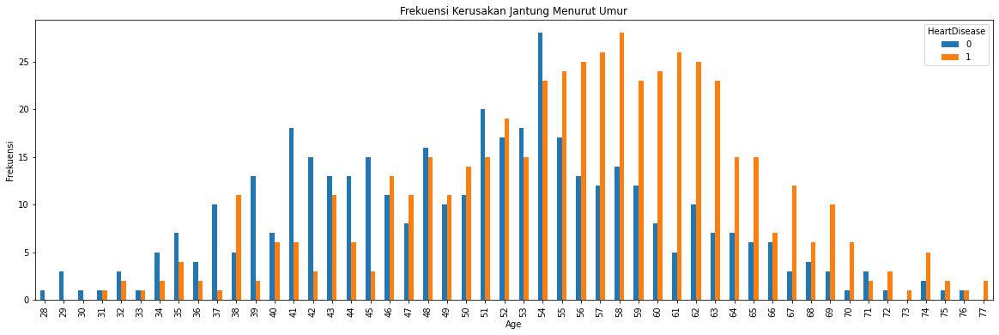

In [38]:
#frek dlm umur
pd.crosstab(df.Age,df.HeartDisease).plot(kind="bar",figsize=(20,6))
plt.title('Frekuensi Kerusakan Jantung Menurut Umur')
plt.xlabel('Age')
plt.ylabel('Frekuensi')
plt.savefig('AgesOfHeartDiseaseProject.png')
plt.show()

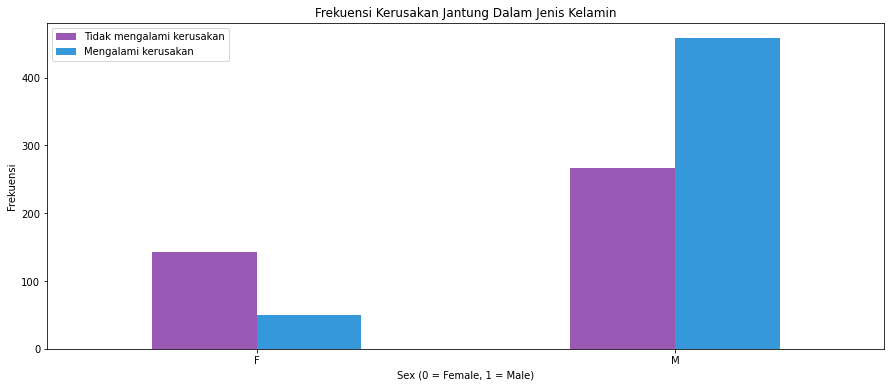

In [46]:
#Frek dlm jenis kelamin
pd.crosstab(df.Sex,df.HeartDisease).plot(kind="bar",figsize=(15,6),color=["#9b59b6", "#3498db"])
plt.title('Frekuensi Kerusakan Jantung Dalam Jenis Kelamin')
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.xticks(rotation=0)
plt.legend(["Tidak mengalami kerusakan", "Mengalami kerusakan"])
plt.ylabel('Frekuensi')
plt.show()

Pasien berjenis kelamin pria lebih banyak frekuensi mengalami kerusakan jantung dibanding dengan pasien wanita

In [33]:
df.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


In [5]:
df.isnull().sum()

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64

<AxesSubplot:title={'center':'Mencari Null Values Menggunakan Heatmap\n'}>

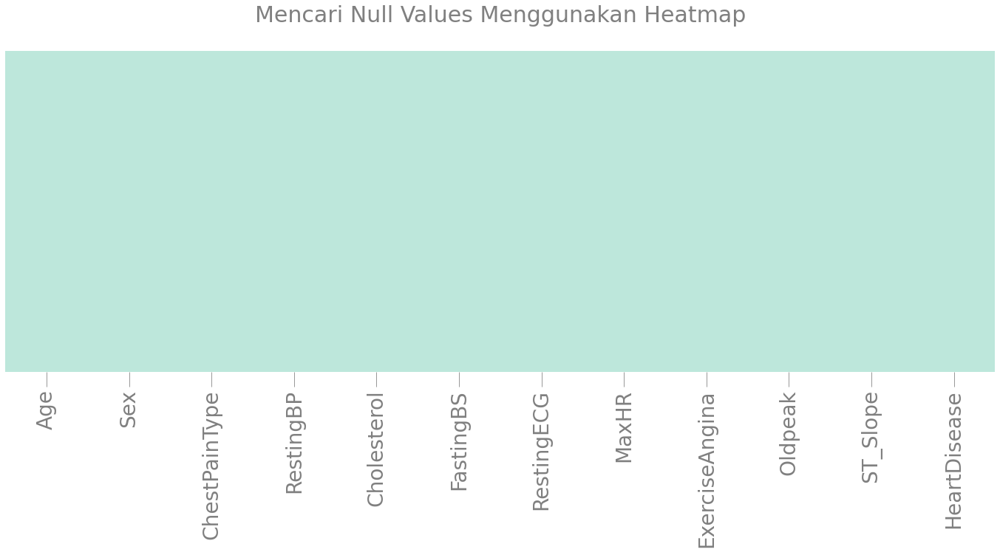

In [87]:
#visualizing Null values 
plt.figure(figsize=(24,8))
plt.xticks(size=28,color='grey')
plt.tick_params(size=20,color='grey')
plt.title('Mencari Null Values Menggunakan Heatmap\n',color='grey',size=30)
sns.heatmap(df.isnull(),
            yticklabels=False,
            cbar=False,
            cmap='icefire',
            )

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


In [4]:
#Mengecek apakah terdapat data yang terduplikasi
df[df.duplicated()]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease


Tidak terdapat data yang terduplikasi

In [7]:
#umur dan jenis kelamin
df['Age'].groupby(df['Sex']).value_counts()

Sex  Age
F    54     15
     51     11
     62     10
     43      9
     48      9
            ..
M    77      2
     28      1
     31      1
     33      1
     76      1
Name: Age, Length: 91, dtype: int64

In [5]:
num_cols = ['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS', 'RestingECG', 'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope']

In [6]:
def num_plot(df, col):
    fig = px.histogram(df, x=col, color="HeartDisease",
                       marginal="box")
    fig.update_layout(height=400, width=500, showlegend=True)
    fig.update_traces(marker_line_width=1,marker_line_color="black")
    fig.show()

In [7]:
for col in num_cols:
    num_plot(df,col)

In [9]:
# 0 values of RestingBP
df[df['RestingBP'] == 0]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
449,55,M,NAP,0,0,0,Normal,155,N,1.5,Flat,1


In [89]:
# 0 values of HeartDisease
df[df['HeartDisease'] == 0]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,1,1,140,289,0,1,172,0,0.0,2,0
2,37,1,1,130,283,0,2,98,0,0.0,2,0
4,54,1,2,150,195,0,1,122,0,0.0,2,0
5,39,1,2,120,339,0,1,170,0,0.0,2,0
6,45,0,1,130,237,0,1,170,0,0.0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...
903,56,1,1,130,221,0,0,163,0,0.0,2,0
904,56,1,1,120,240,0,1,169,0,0.0,0,0
906,55,0,1,132,342,0,1,166,0,1.2,2,0
910,41,1,1,120,157,0,1,182,0,0.0,2,0


In [90]:
#0 values of cholesterol
df[df['Cholesterol'] == 0]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
293,65,1,0,115,0,0,1,93,1,0.0,1,1
294,32,1,3,95,0,1,1,127,0,0.7,2,1
295,61,1,0,105,0,1,1,110,1,1.5,2,1
296,50,1,0,145,0,1,1,139,1,0.7,1,1
297,57,1,0,110,0,1,2,131,1,1.4,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...
514,43,1,0,122,0,0,1,120,0,0.5,2,1
515,63,1,2,130,0,1,2,160,0,3.0,1,0
518,48,1,2,102,0,1,2,110,1,1.0,0,1
535,56,1,0,130,0,0,0,122,1,1.0,1,1


In [24]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (25.9 MB)


In [91]:
#Eksplorasi data otomatis :D
import pandas_profiling as pp
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Expanatory Data Analysis #

In [16]:
#Data yang tidak termasuk numerik akan diencoding
encoded_df = pd.get_dummies(df, drop_first=True)

In [33]:
encoded_df

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease,Sex_M,ChestPainType_ATA,ChestPainType_NAP,ChestPainType_TA,RestingECG_Normal,RestingECG_ST,ExerciseAngina_Y,ST_Slope_Flat,ST_Slope_Up
0,40,140,289,0,172,0.0,0,1,1,0,0,1,0,0,0,1
1,49,160,180,0,156,1.0,1,0,0,1,0,1,0,0,1,0
2,37,130,283,0,98,0.0,0,1,1,0,0,0,1,0,0,1
3,48,138,214,0,108,1.5,1,0,0,0,0,1,0,1,1,0
4,54,150,195,0,122,0.0,0,1,0,1,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,110,264,0,132,1.2,1,1,0,0,1,1,0,0,1,0
914,68,144,193,1,141,3.4,1,1,0,0,0,1,0,0,1,0
915,57,130,131,0,115,1.2,1,1,0,0,0,1,0,1,1,0
916,57,130,236,0,174,0.0,1,0,1,0,0,0,0,0,1,0


# Matriks Korelasi #

<AxesSubplot:xlabel='ExerciseAngina', ylabel='count'>

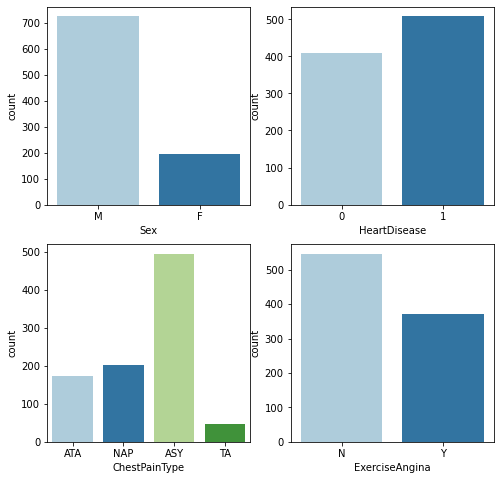

In [27]:
plt.figure(figsize = (8,8))
plt.subplot(2,2,1)
sns.countplot('Sex', data = df, palette = 'Paired')

plt.subplot(2,2,2)
sns.countplot('HeartDisease', data = df, palette = 'Paired')

plt.subplot(2,2,3)
sns.countplot('ChestPainType', data = df, palette = 'Paired')

plt.subplot(2,2,4)
sns.countplot('ExerciseAngina', data = df, palette = 'Paired')

<AxesSubplot:>

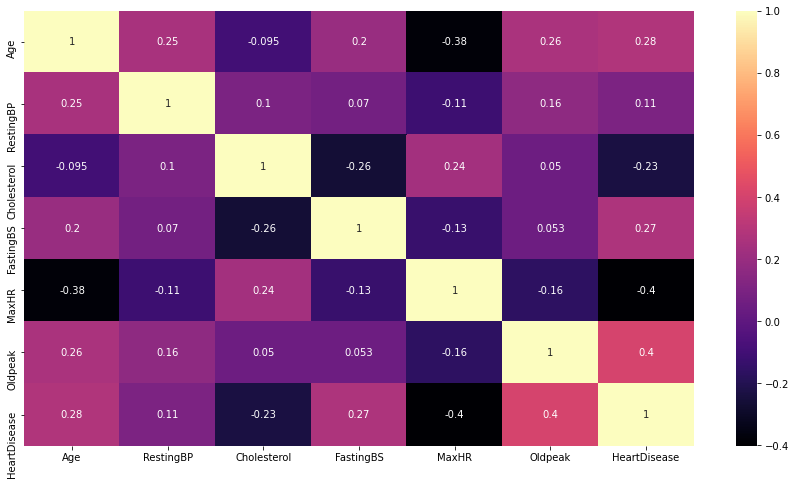

In [12]:
plt.figure(figsize = (15,8))
sns.heatmap(df.corr(), annot = True, cmap ='magma')

In [9]:
for i in df.columns:
    print(i,len(df[i].unique()))

Age 50
Sex 2
ChestPainType 4
RestingBP 67
Cholesterol 222
FastingBS 2
RestingECG 3
MaxHR 119
ExerciseAngina 2
Oldpeak 53
ST_Slope 3
HeartDisease 2


# Visualisasi Data #

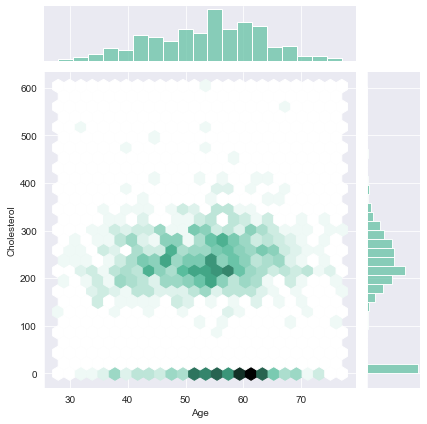

In [11]:
sns.jointplot(x = 'Age', y = 'Cholesterol', data = df, kind = 'hex')

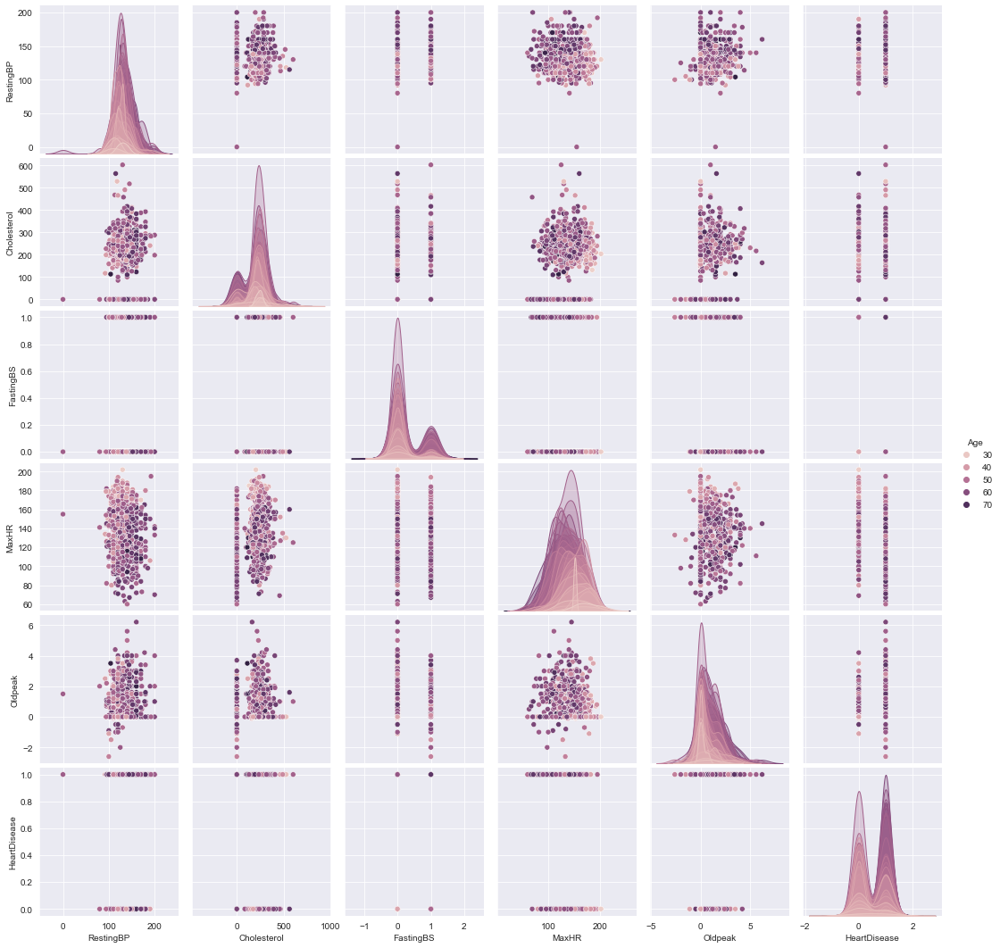

In [12]:
sns.pairplot(df, hue = 'Age')

In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


In [53]:
en = LabelEncoder()

In [54]:
cols = ['Sex','ChestPainType','RestingECG','ExerciseAngina','ST_Slope']
for col in cols:
    df[col] = en.fit_transform(df[col])

In [102]:
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,1,1,140,289,0,1,172,0,0.0,2,0
1,49,0,2,160,180,0,1,156,0,1.0,1,1
2,37,1,1,130,283,0,2,98,0,0.0,2,0
3,48,0,0,138,214,0,1,108,1,1.5,1,1
4,54,1,2,150,195,0,1,122,0,0.0,2,0


# Regresi Logistik #

In [76]:
y = df.HeartDisease.values
x_data = df.drop(['HeartDisease'], axis = 1)

In [77]:
# Normalisasi
x = (x_data - np.min(x_data)) / (np.max(x_data) - np.min(x_data)).values

In [78]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2,random_state=0)
#transpose matrices
x_train = x_train.T
y_train = y_train.T
x_test = x_test.T
y_test = y_test.T

In [79]:
lr = LogisticRegression()
lr.fit(x_train.T,y_train.T)
print("Akurasi Tes sebesar {:.2f}%".format(lr.score(x_test.T,y_test.T)*100))

Akurasi Tes sebesar 84.24%


In [80]:
#initialize
def initialize(dimension):
    
    weight = np.full((dimension,1),0.01)
    bias = 0.0
    return weight,bias

In [81]:
#sigmoid
def sigmoid(z):
    
    y_head = 1/(1+ np.exp(-z))
    return y_head

In [96]:
# KNN Model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 2)  # n_neighbors means k
knn.fit(x_train.T, y_train.T)
prediction = knn.predict(x_test.T)
print("{} Skor NN : {:.2f}%".format(2, knn.score(x_test.T, y_test.T)*100))

2 Skor NN : 80.43%


Skor KNN maksimal adalah  85.33%


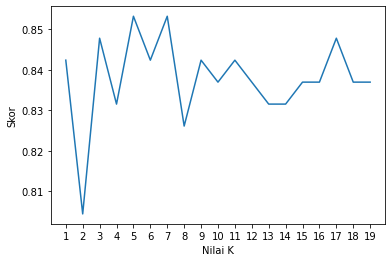

In [95]:
# Mencoba menemukan Nilai K terbaik/maks
scoreList = []
for i in range(1,20):
    knn2 = KNeighborsClassifier(n_neighbors = i)  
    knn2.fit(x_train.T, y_train.T)
    scoreList.append(knn2.score(x_test.T, y_test.T))
    
plt.plot(range(1,20), scoreList)
plt.xticks(np.arange(1,20,1))
plt.xlabel("Nilai K")
plt.ylabel("Skor")
plt.show()
print("Skor KNN maksimal adalah  {:.2f}%".format((max(scoreList))*100))

In [98]:
#Menggunakan SVM Alg
from sklearn.svm import SVC
svm = SVC(random_state = 1)
svm.fit(x_train.T, y_train.T)
print("Tes akurasi SVM adalah: {:.2f}%".format(svm.score(x_test.T,y_test.T)*100))

Tes akurasi SVM adalah: 84.78%


In [97]:
cr = classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.39      0.36      0.38        77
           1       0.56      0.59      0.58       107

    accuracy                           0.49       184
   macro avg       0.48      0.48      0.48       184
weighted avg       0.49      0.49      0.49       184

